In [1]:
import pandas as pd
import numpy as np

from cleantext import clean

Since the GPL-licensed package `unidecode` is not installed, using Python's `unicodedata` package which yields worse results.


In [2]:
# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel


In [3]:
# spacy for lemmatization
import spacy

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim_models
import matplotlib.pyplot as plt

#Enable logging for gensim
import logging
logging.basicConfig(format='%(asctime)s:%(levelname)s:%(message)s',level=logging.ERROR)

import warnings
warnings.filterwarnings('ignore',category=DeprecationWarning)

# NLTK stop words
from nltk.corpus import stopwords
stop_words=stopwords.words('english')
#stop_words.extend(['great','app','good','apps','really','nice'])

import datetime
import os

In [4]:
df=pd.read_csv('spotify2.csv')

In [5]:
df.shape

(485958, 12)

In [6]:
df['content']=df['content'].apply(lambda x: clean(x, no_emoji=True, no_punct=True))

In [7]:
df.head()

,Unnamed: 0,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,appVersion
0,0,fa53a8f2-3ba4-4997-9c17-1707b366e0f9,Sumit Pawar,https://play-lh.googleusercontent.com/a-/ALV-U...,too much adds,1,0,8.8.90.893,2023-11-29 11:38:14,Hi! We’re sorry to hear this and we’ll pass yo...,2023-11-29 14:02:27,8.8.90.893
1,1,c9e781c4-73e0-499b-949d-5ff5bb58e82c,Jagannath Swain,https://play-lh.googleusercontent.com/a-/ALV-U...,i used spotify from last 5 to 6 years but the ...,1,0,8.5.32.889,2023-11-29 11:37:28,NaN,NaN,8.5.32.889
2,2,4eced852-2d24-4ba8-8f8c-a5003981dd6a,AKSHAY R.S,https://play-lh.googleusercontent.com/a-/ALV-U...,booooring,1,0,8.8.90.893,2023-11-29 11:37:05,NaN,NaN,8.8.90.893
3,3,fc260e5f-dcd7-4f21-9104-a8525fb58893,Rozaria Martin Bryan,https://play-lh.googleusercontent.com/a-/ALV-U...,i would use spotify with adjusting the equaliz...,4,0,NaN,2023-11-29 11:36:07,NaN,NaN,NaN
4,4,7a573431-19f9-4544-86ac-1e0249f9bc06,Madison,https://play-lh.googleusercontent.com/a-/ALV-U...,too many ads ive had premium and i find that i...,2,1,8.8.90.893,2023-11-29 11:31:46,"Hey, thanks for the feedback. If you haven't t...",2020-10-06 18:29:40,8.8.90.893


In [8]:
df.columns

Index(['Unnamed: 0', 'reviewId', 'userName', 'userImage', 'content', 'score',
       'thumbsUpCount', 'reviewCreatedVersion', 'at', 'replyContent',
       'repliedAt', 'appVersion'],
      dtype='object')

In [9]:
df=df.drop(columns=["Unnamed: 0", 'reviewId', 'userName', 'userImage','replyContent',
       'repliedAt', 'appVersion'], axis=1)

In [10]:
df.columns

Index(['content', 'score', 'thumbsUpCount', 'reviewCreatedVersion', 'at'], dtype='object')

In [11]:
df.head()

,content,score,thumbsUpCount,reviewCreatedVersion,at
0,too much adds,1,0,8.8.90.893,2023-11-29 11:38:14
1,i used spotify from last 5 to 6 years but the ...,1,0,8.5.32.889,2023-11-29 11:37:28
2,booooring,1,0,8.8.90.893,2023-11-29 11:37:05
3,i would use spotify with adjusting the equaliz...,4,0,NaN,2023-11-29 11:36:07
4,too many ads ive had premium and i find that i...,2,1,8.8.90.893,2023-11-29 11:31:46


In [12]:
# Tokenize words and Clean-up text
data= df.content.values.tolist()
def content_to_words(sentences):
    for sentence in sentences:
        yield (gensim.utils.simple_preprocess(str(sentence),deacc=True)) #deacc=True removes punctuations


In [13]:
data_words=list(content_to_words(data))
print(data_words[:1])
count=[len(sublist) for sublist in data_words ]
df['words']=data_words
df['review_len']=count
data_words=[sublist for sublist in data_words if len(sublist)>1]
df=df[df['words'].map(len) >1]

[['too', 'much', 'adds']]


In [14]:
# Creating Bigram and Trigram Models
bigram=gensim.models.Phrases(data_words,min_count=5,threshold=10) #higher threshold fewer phrase
trigram=gensim.models.Phrases(bigram[data_words],threshold=10)

#faster way to get a sentence clubbed as a trigram/bigram
bigram_mod=gensim.models.phrases.Phraser(bigram)
trigram_mod=gensim.models.phrases.Phraser(trigram)

In [15]:
def remove_stopwords(texts):
    return[[word for word in simple_preprocess(str(doc))if word not in stop_words]for doc in texts]

def make_bigram(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return[trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN','ADJ','VERB',"ADV"]):
    """https://spacy.io/api/annotation"""
    texts_out=[]
    for content in texts:
        doc=nlp(" ".join(content))
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [100]:
print(stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [16]:
data_words_nostops= remove_stopwords(data_words)

In [17]:
data_words_bigram= make_bigram(data_words_nostops)
#data_words_bigram= make_bigram(data_words)
print(data_words_bigram[:1])


[['much', 'adds']]


In [18]:
data_words_trigram=make_trigrams(data_words_nostops)
#data_words_trigram=make_trigrams(data_words)
print(data_words_trigram[:1])

[['much', 'adds']]


In [19]:
nlp=spacy.load("en_core_web_sm",disable=['parser,ner'])
data_lemmatized= lemmatization(data_words_trigram,allowed_postags=['NOUN','ADJ','VERB','ADV'])

print(data_lemmatized[:1])
df['words']=data_lemmatized

[['much', 'add']]


In [20]:
data_lemmatized=[sublist for sublist in data_lemmatized if len(sublist)>1]
df=df[df['words'].map(len) >1]

In [21]:
data_words_nostops= remove_stopwords(data_lemmatized)
data_lemmatized=data_words_nostops

In [22]:
id2word= corpora.Dictionary(data_lemmatized)

In [23]:
#Create Corpus
texts=(data_lemmatized)

In [24]:
#Term Document Frequency
corpus=[id2word.doc2bow(text) for text in texts]

In [25]:
print(corpus[:1])

[[(0, 1), (1, 1)]]


In [26]:
#If you want to see what word a given id corresponds to, pass the id as a key to the dictionary.
id2word[0]

[[(id2word[id],freq) for id, freq in cp]for cp in corpus[:1]]


[[('add', 1), ('much', 1)]]

In [27]:

def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus,id2word=id2word,
                                         num_topics=num_topics,random_state=100,
                                         alpha='auto',per_word_topics=True)
        model_list.append(model)

        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())
    return model_list, coherence_values

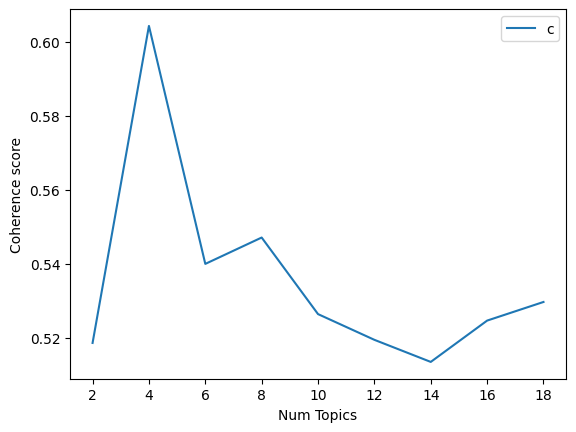

In [28]:

model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=texts, start=2, limit=20, step=2)

#Show graph
limit=20; start=2; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [29]:

lda_model= gensim.models.ldamodel.LdaModel(corpus=corpus,id2word=id2word,
                                           num_topics=4,random_state=100,
                                           alpha='auto',per_word_topics=True)


In [30]:
from pprint import pprint
# Print the Keyword in the 10 topics
doc_lda=lda_model[corpus]
pprint(lda_model.print_topics())


[(0,
  '0.036*"free" + 0.028*"pay" + 0.028*"service" + 0.022*"subscription" + '
  '0.017*"premium" + 0.016*"guy" + 0.016*"money" + 0.013*"worth" + '
  '0.012*"month" + 0.012*"wonderful"'),
 (1,
  '0.094*"song" + 0.047*"premium" + 0.046*"app" + 0.036*"want" + '
  '0.030*"spotify" + 0.030*"update" + 0.029*"listen" + 0.028*"bad" + '
  '0.026*"make" + 0.023*"even"'),
 (2,
  '0.054*"song" + 0.037*"play" + 0.034*"playlist" + 0.031*"ad" + 0.017*"get" + '
  '0.015*"add" + 0.014*"spotify" + 0.012*"listen" + 0.011*"work" + '
  '0.010*"time"'),
 (3,
  '0.136*"app" + 0.133*"music" + 0.097*"good" + 0.050*"love" + 0.040*"great" + '
  '0.039*"spotify" + 0.031*"use" + 0.020*"well" + 0.019*"nice" + '
  '0.018*"listen"')]


In [31]:

#compute perplexity
lda_perplexity=lda_model.log_perplexity(corpus)
print('\nPerplexity:',lda_perplexity)# a measure of how good the model is, lower the better.


#compute coherence score
coherence_model_lda=CoherenceModel(model=lda_model,texts=texts,dictionary=id2word,coherence='c_v')
coherence_lda=coherence_model_lda.get_coherence()
print('\nCoherence Score:',coherence_lda)


Perplexity: -6.557633665845654

Coherence Score: 0.6042165413490328


In [32]:

#vis=pyLDAvis.gensim_models.prepare(lda_model,corpus,id2word)
#pyLDAvis.save_html(vis,"spotify2.html")
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus,id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.093635 -0.254440       1        1  39.539552
1     -0.082779 -0.112171       2        1  27.205099
3     -0.196936  0.298069       3        1  26.106805
0      0.373350  0.068542       4        1   7.148545, topic_info=         Term           Freq          Total Category  logprob  loglift
38      music   98582.000000   98582.000000  Default  30.0000  30.0000
32        app  136210.000000  136210.000000  Default  29.0000  29.0000
33       good   72039.000000   72039.000000  Default  28.0000  28.0000
11       song  133571.000000  133571.000000  Default  27.0000  27.0000
67       love   36966.000000   36966.000000  Default  26.0000  26.0000
...       ...            ...            ...      ...      ...      ...
109       pay    5764.683374   17875.853275   Topic4  -3.5610   1.5066
1935   simple     992.184815    1145.839251   Topic4  -5.3206   2.4943
8     premium    3540.935016   39684.999509   Topic4  -4.0483   0.2217
411    people    1527.243508    5092.403092   Topic4  -4.8893   1.4340
12    spotify    2356.173947   70626.013219   Topic4  -4.4557  -0.7621

[271 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
1093      2  0.999004   accord
2         1  0.999833       ad
2         2  0.000057       ad
2         3  0.000029       ad
2         4  0.000086       ad
...     ...       ...      ...
233       4  0.094199     year
450       1  0.035582  youtube
450       2  0.036334  youtube
450       3  0.890052  youtube
450       4  0.038088  youtube

[467 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 2, 4, 1])

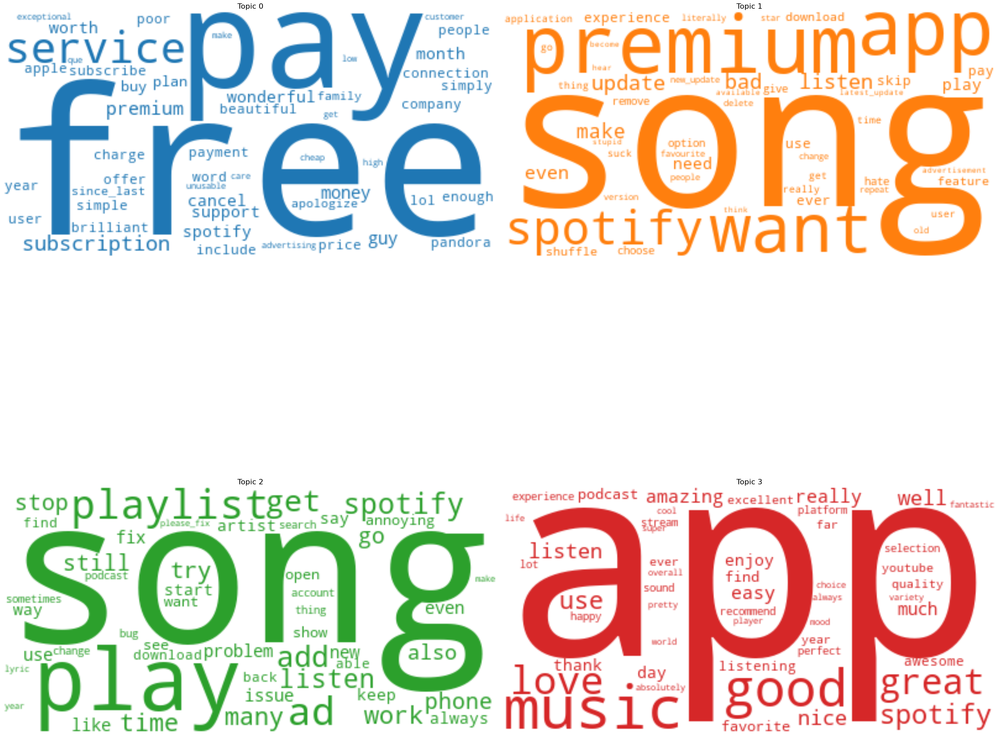

In [33]:

# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  max_words=50,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(num_words=50,formatted=False)

fig, axes = plt.subplots(2, 2, figsize=(30,30), sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud,interpolation='bilinear')
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=5, hspace=5)
plt.axis('off')
plt.margins(x=5, y=5)
plt.tight_layout()
plt.show()


In [34]:
def format_topics_sentences(ldamodel=None, corpus=corpus, texts=data):
    # Init output
    sent_topics = []
    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                #sent_topics_df = pd.concat([sent_topics_df, pd.DataFrame([int(topic_num), round(prop_topic,4), topic_keywords])], axis=0)
                new_row = [int(topic_num), round(prop_topic,4), topic_keywords]
                sent_topics.append(new_row)
            else:
                break
    sent_topics_df = pd.DataFrame(sent_topics, columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords'] )
    # Add original text to the end of the output
    contents = pd.DataFrame(pd.Series(texts))
    contents.columns = ["Text"]
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return sent_topics_df

In [35]:
df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=texts)


In [36]:
df_topic_sents_keywords.head()

,Dominant_Topic,Perc_Contribution,Topic_Keywords,Text
0,2,0.4387,"song, play, playlist, ad, get, add, spotify, l...","[much, add]"
1,1,0.5562,"song, premium, app, want, spotify, update, lis...","[use, spotify, last_year, recent_update, liste..."
2,3,0.3421,"app, music, good, love, great, spotify, use, w...","[use, spotify, adjust, equalizer, listening, e..."
3,2,0.5429,"song, play, playlist, ad, get, add, spotify, l...","[many, ad, premium, find, alot, money, much, t..."
4,3,0.5446,"app, music, good, love, great, spotify, use, w...","[good, app]"


In [37]:

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(10)
df[['Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords']]=df_dominant_topic[['Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords']].values


In [38]:
df.head()

,content,score,thumbsUpCount,reviewCreatedVersion,at,words,review_len,Dominant_Topic,Topic_Perc_Contrib,Keywords
0,too much adds,1,0,8.8.90.893,2023-11-29 11:38:14,"[much, add]",3,2,0.4387,"song, play, playlist, ad, get, add, spotify, l..."
1,i used spotify from last 5 to 6 years but the ...,1,0,8.5.32.889,2023-11-29 11:37:28,"[use, spotify, last_year, recent_update, liste...",51,1,0.5562,"song, premium, app, want, spotify, update, lis..."
3,i would use spotify with adjusting the equaliz...,4,0,NaN,2023-11-29 11:36:07,"[use, spotify, adjust, equalizer, listening, e...",24,3,0.3421,"app, music, good, love, great, spotify, use, w..."
4,too many ads ive had premium and i find that i...,2,1,8.8.90.893,2023-11-29 11:31:46,"[many, ad, premium, find, alot, money, much, t...",25,2,0.5429,"song, play, playlist, ad, get, add, spotify, l..."
5,very good app,5,0,8.8.90.893,2023-11-29 11:31:14,"[good, app]",3,3,0.5446,"app, music, good, love, great, spotify, use, w..."


In [39]:

# import  openpyxl
# file_path = os.getcwd()
# file_name = 'spotify_result2.xlsx'
# save_file = os.path.join(file_path, file_name)
# df.to_excel(save_file,
#                  engine='openpyxl',
#                  startrow=0,
#                  startcol=0,
#                  header=True,
#                  na_rep='NaN',
#                  float_format='%.2f',
#                  sheet_name='Sheet1'
#                  )



In [40]:
df.columns

Index(['content', 'score', 'thumbsUpCount', 'reviewCreatedVersion', 'at',
       'words', 'review_len', 'Dominant_Topic', 'Topic_Perc_Contrib',
       'Keywords'],
      dtype='object')

In [41]:
df['at'] = pd.to_datetime(df["at"]).dt.date
pdate=datetime.date(2023,7,1)

In [42]:
df_before=df.loc[(df['at']<pdate)].reset_index()
df_after=df.loc[(df['at']>=pdate)].reset_index()

In [43]:
#df_before.to_csv

In [44]:
#df_after.to_csv

Before

In [45]:
data_lemmatized1=df_before['words']
id2word1= corpora.Dictionary(data_lemmatized1)

In [46]:
texts1=(data_lemmatized1)

In [47]:
#Term Document Frequency
corpus1=[id2word1.doc2bow(text) for text in texts1]

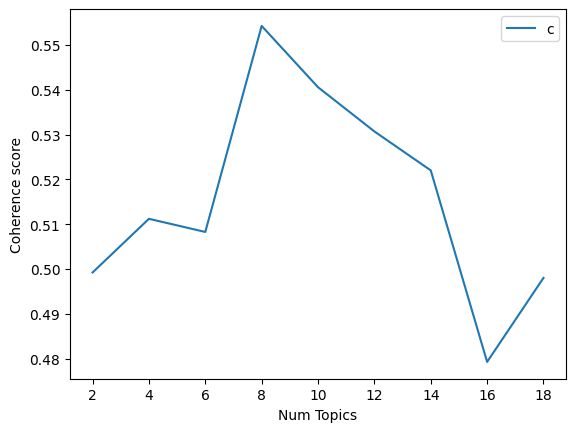

In [48]:

model_list1, coherence_values1 = compute_coherence_values(dictionary=id2word1, corpus=corpus1, texts=texts1, start=2, limit=20, step=2)

#Show graph
limit=20; start=2; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values1)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [49]:

lda_model1= gensim.models.ldamodel.LdaModel(corpus=corpus1,id2word=id2word1,
                                           num_topics=8,random_state=100,
                                           alpha='auto',per_word_topics=True)


In [50]:
from pprint import pprint
doc_lda1=lda_model1[corpus1]
pprint(lda_model1.print_topics())


[(0,
  '0.129*"spotify" + 0.121*"love" + 0.054*"music" + 0.029*"listen" + '
  '0.028*"find" + 0.027*"use" + 0.022*"thank" + 0.019*"artist" + 0.017*"year" '
  '+ 0.016*"make"'),
 (1,
  '0.034*"spotify" + 0.029*"work" + 0.025*"issue" + 0.024*"phone" + '
  '0.021*"update" + 0.020*"problem" + 0.020*"try" + 0.018*"app" + '
  '0.018*"still" + 0.018*"use"'),
 (2,
  '0.185*"ad" + 0.089*"premium" + 0.062*"many" + 0.044*"pay" + 0.039*"get" + '
  '0.029*"free" + 0.028*"wrap" + 0.022*"much" + 0.014*"money" + '
  '0.013*"minute"'),
 (3,
  '0.022*"star" + 0.014*"add" + 0.014*"make" + 0.014*"change" + '
  '0.014*"spotify" + 0.014*"give" + 0.013*"back" + 0.011*"thing" + '
  '0.011*"less" + 0.011*"podcast"'),
 (4,
  '0.139*"great" + 0.087*"app" + 0.075*"well" + 0.049*"amazing" + '
  '0.048*"music" + 0.039*"much" + 0.028*"add" + 0.023*"love" + 0.023*"awesome" '
  '+ 0.020*"excellent"'),
 (5,
  '0.071*"use" + 0.070*"nice" + 0.063*"app" + 0.036*"easy" + 0.014*"perfect" + '
  '0.014*"need" + 0.010*"option"

In [51]:

#compute perplexity
lda_perplexity1=lda_model1.log_perplexity(corpus1)
print('\nPerplexity:',lda_perplexity1)# a measure of how good the model is, lower the better.


#compute coherence score
coherence_model_lda1=CoherenceModel(model=lda_model1,texts=texts1,dictionary=id2word1,coherence='c_v')
coherence_lda1=coherence_model_lda1.get_coherence()
print('\nCoherence Score:',coherence_lda1)


Perplexity: -6.91141941600052

Coherence Score: 0.5380891579158424


In [52]:
len(doc_lda1)

128591

In [53]:

# vis1=pyLDAvis.gensim_models.prepare(lda_model1,corpus1,id2word1)
# pyLDAvis.save_html(vis1,"spotify_before.html")
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model1,corpus1,id2word1)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7     -0.177279  0.104586       1        1  29.329186
6      0.274572  0.035639       2        1  17.100667
1     -0.159804  0.131680       3        1  12.329614
0      0.050961  0.049394       4        1  10.616613
3     -0.161254  0.016229       5        1   7.984903
4      0.282217 -0.121130       6        1   7.659231
5      0.049836  0.141676       7        1   7.585659
2     -0.159248 -0.358073       8        1   7.394128, topic_info=         Term          Freq         Total Category  logprob  loglift
15       good  31117.000000  31117.000000  Default  30.0000  30.0000
0         app  53233.000000  53233.000000  Default  29.0000  29.0000
5       music  42484.000000  42484.000000  Default  28.0000  28.0000
22       song  44591.000000  44591.000000  Default  27.0000  27.0000
100        ad  14847.000000  14847.000000  Default  26.0000  26.0000
..        ...           ...           ...      ...      ...      ...
59    spotify    535.448996  26796.221898   Topic8  -5.0102  -1.3084
130       way    402.113836   3230.207466   Topic8  -5.2965   0.5209
9    annoying    389.111304   2558.060592   Topic8  -5.3294   0.7213
162       say    381.620794   2918.875202   Topic8  -5.3488   0.5700
146         s    371.185004   3080.922523   Topic8  -5.3766   0.4882

[525 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
459       4  0.996624         aap
1471      2  0.995510    absolute
516       1  0.007331  absolutely
516       4  0.989724  absolutely
516       5  0.000815  absolutely
...     ...       ...         ...
427       2  0.073459     youtube
427       4  0.037640     youtube
427       5  0.277444     youtube
427       6  0.214913     youtube
427       8  0.009106     youtube

[1129 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 7, 2, 1, 4, 5, 6, 3])

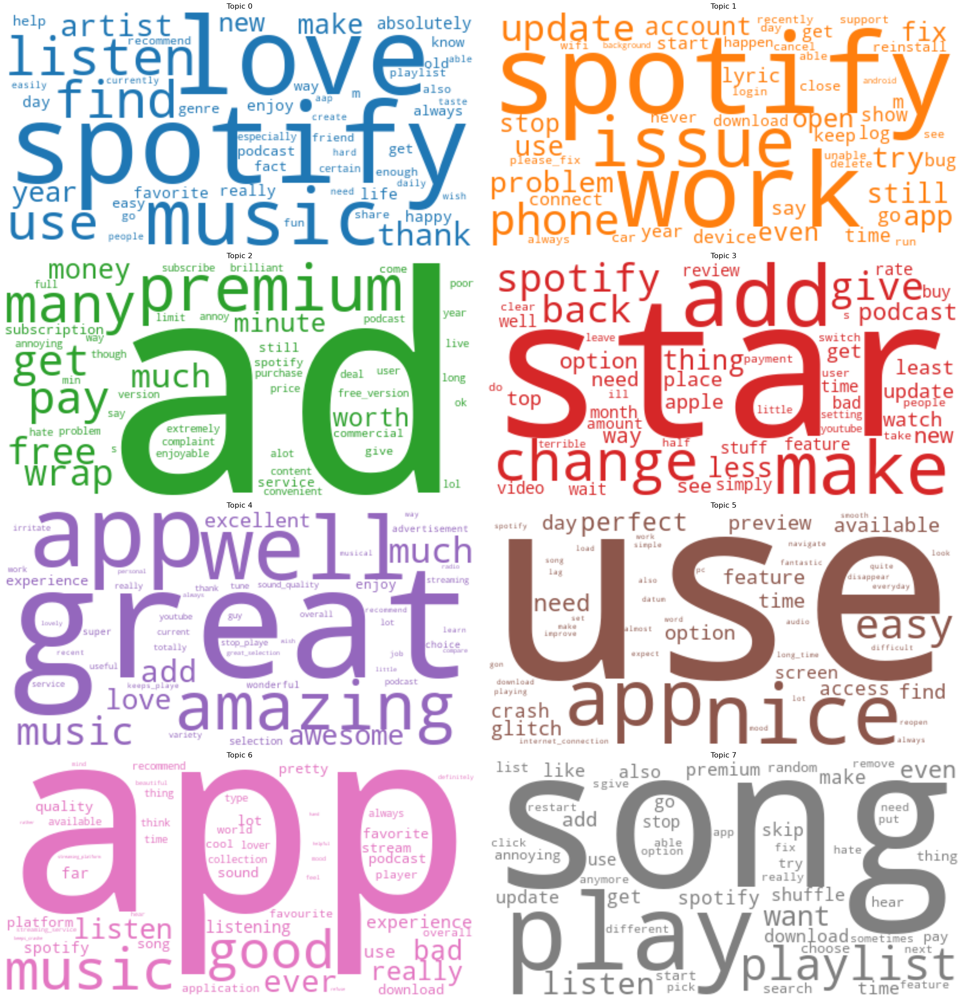

In [54]:
topics1 = lda_model1.show_topics(num_words=50,formatted=False)

fig, axes = plt.subplots(4, 2, figsize=(30,30), sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words1 = dict(topics1[i][1])
    cloud.generate_from_frequencies(topic_words1, max_font_size=300)
    plt.gca().imshow(cloud,interpolation='bilinear')
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=5, hspace=5)
plt.axis('off')
plt.margins(x=5, y=5)
plt.tight_layout()
plt.show()

In [55]:
df_topic_sents_keywords1 = format_topics_sentences(ldamodel=lda_model1, corpus=corpus1, texts=texts1)

In [56]:

# Format
df_dominant_topic1 = df_topic_sents_keywords1.reset_index()
df_dominant_topic1.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic1.head(10)
df_before[['Before_Dominant_Topic', 'Before_Topic_Perc_Contrib', 'Before_Keywords']]=df_dominant_topic1[['Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords']].values


In [57]:
# file_name = 'spotify_before_result.xlsx'
# save_file = os.path.join(file_path, file_name)
# df_before.to_excel(save_file,
#                  engine='openpyxl',
#                  startrow=0,
#                  startcol=0,
#                  header=True,
#                  na_rep='NaN',
#                  float_format='%.2f',
#                  sheet_name='Sheet1'
#                  )

after

In [58]:
data_lemmatized2=df_after['words']
id2word2= corpora.Dictionary(data_lemmatized2)

In [59]:
texts2=(data_lemmatized2)

In [60]:
#Term Document Frequency
corpus2=[id2word2.doc2bow(text) for text in texts2]

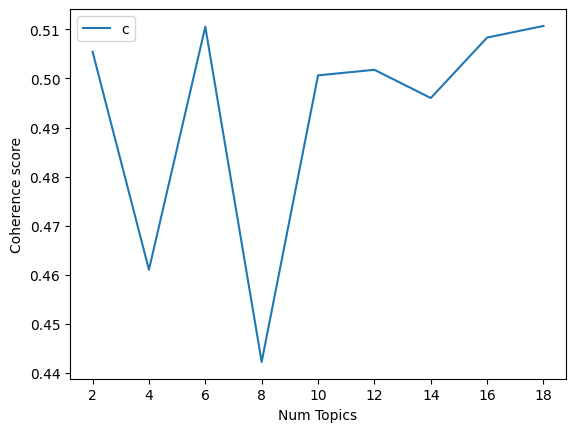

In [61]:

model_list2, coherence_values2 = compute_coherence_values(dictionary=id2word2, corpus=corpus2, texts=texts2, start=2, limit=20, step=2)

#Show graph
limit=20; start=2; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values2)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [62]:

lda_model2= gensim.models.ldamodel.LdaModel(corpus=corpus2,id2word=id2word2,
                                           num_topics=6,random_state=100,
                                           alpha='auto',per_word_topics=True)


In [63]:
from pprint import pprint
doc_lda2=lda_model2[corpus2]
pprint(lda_model2.print_topics())


[(0,
  '0.148*"ad" + 0.066*"much" + 0.036*"premium" + 0.034*"get" + '
  '0.016*"subscription" + 0.016*"money" + 0.014*"full" + 0.013*"spotify" + '
  '0.013*"many" + 0.013*"minute"'),
 (1,
  '0.038*"country" + 0.030*"try" + 0.029*"problem" + 0.027*"work" + '
  '0.023*"issue" + 0.023*"account" + 0.022*"phone" + 0.021*"log" + '
  '0.020*"login" + 0.019*"show"'),
 (2,
  '0.347*"application" + 0.058*"love" + 0.052*"great" + 0.023*"useless" + '
  '0.019*"podcast" + 0.019*"amazing" + 0.016*"day" + 0.016*"easy" + '
  '0.011*"spotify" + 0.010*"music"'),
 (3,
  '0.073*"many" + 0.044*"waste" + 0.040*"ad" + 0.038*"time" + '
  '0.020*"dont_install" + 0.013*"less" + 0.011*"crash" + 0.009*"protest" + '
  '0.007*"quran" + 0.007*"mobile"'),
 (4,
  '0.108*"song" + 0.042*"play" + 0.038*"listen" + 0.028*"playlist" + '
  '0.024*"want" + 0.022*"add" + 0.022*"even" + 0.016*"spotify" + 0.015*"like" '
  '+ 0.015*"premium"'),
 (5,
  '0.192*"app" + 0.130*"hate" + 0.110*"bad" + 0.061*"music" + 0.056*"good" + '
  

In [64]:

#compute perplexity
lda_perplexity2=lda_model2.log_perplexity(corpus2)
print('\nPerplexity:',lda_perplexity2)# a measure of how good the model is, lower the better.


#compute coherence score
coherence_model_lda2=CoherenceModel(model=lda_model2,texts=texts2,dictionary=id2word2,coherence='c_v')
coherence_lda2=coherence_model_lda2.get_coherence()
print('\nCoherence Score:',coherence_lda2)


Perplexity: -6.703978106256241

Coherence Score: 0.5280580088288707


In [65]:

# vis2=pyLDAvis.gensim_models.prepare(lda_model2,corpus2,id2word2)
# pyLDAvis.save_html(vis2,"spotify_after.html")

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model2,corpus2,id2word2)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.069596 -0.101781       1        1  37.487374
5      0.279637 -0.210719       2        1  33.679206
0     -0.165976 -0.111072       3        1   8.391724
2      0.161579  0.329398       4        1   8.271180
1     -0.088986  0.110532       5        1   7.667867
3     -0.255851 -0.016358       6        1   4.502649, topic_info=             Term           Freq          Total Category  logprob  loglift
208   application   51542.000000   51542.000000  Default  30.0000  30.0000
32            app  117322.000000  117322.000000  Default  29.0000  29.0000
179          hate   81226.000000   81226.000000  Default  28.0000  28.0000
51            bad   66241.000000   66241.000000  Default  27.0000  27.0000
11           song   72351.000000   72351.000000  Default  26.0000  26.0000
...           ...            ...            ...      ...      ...      ...
1407       mobile     601.336845    1254.716855   Topic6  -4.9009   2.3650
236         phone     485.002859    3613.296314   Topic6  -5.1159   1.0923
600           run     328.921615     584.435376   Topic6  -5.5043   2.5257
398           lot     401.455493    4046.763254   Topic6  -5.3050   0.7899
249          stop     375.219655    4625.063001   Topic6  -5.3726   0.5888

[370 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
858       2  0.999409         aap
18        1  0.777037        able
18        5  0.222609        able
18        6  0.000247        able
103       1  0.274830  absolutely
...     ...       ...         ...
238       2  0.509427        year
238       3  0.058913        year
238       4  0.107719        year
238       5  0.126202        year
238       6  0.013284        year

[765 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 6, 1, 3, 2, 4])

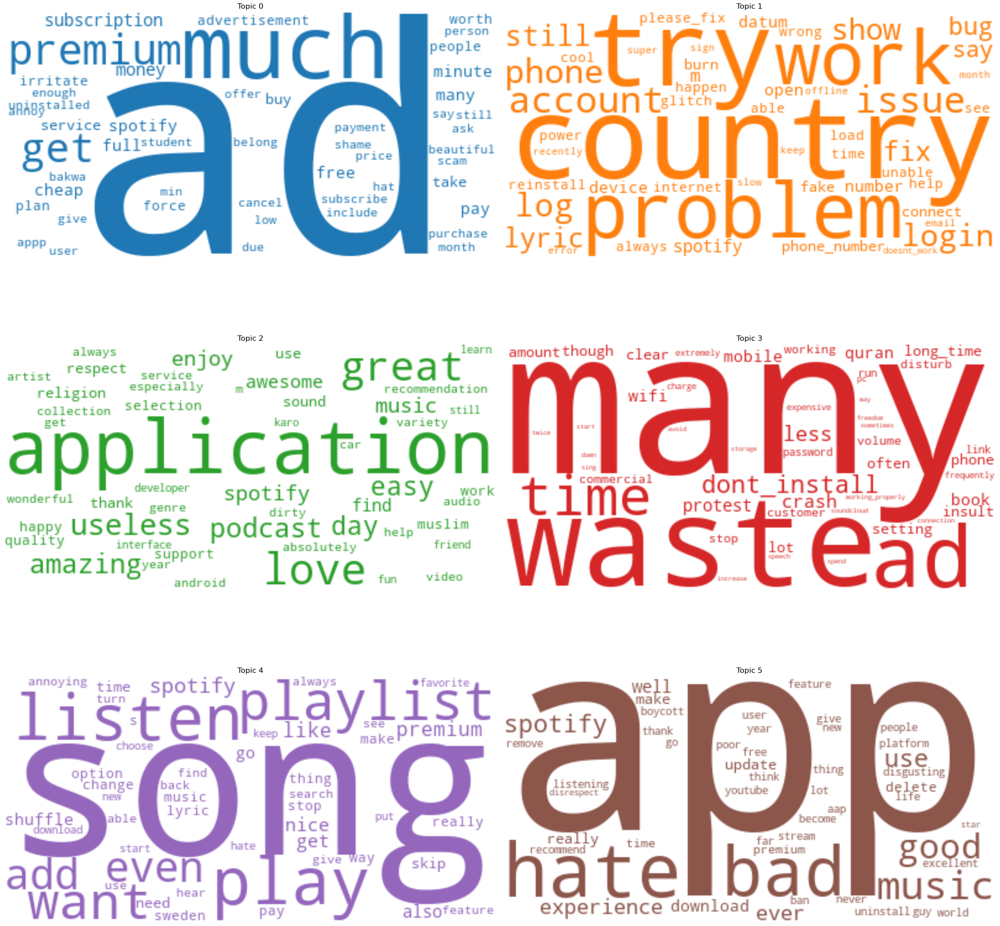

In [66]:
topics2 = lda_model2.show_topics(num_words=50,formatted=False)

fig, axes = plt.subplots(3, 2, figsize=(30,30), sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words2 = dict(topics2[i][1])
    cloud.generate_from_frequencies(topic_words2, max_font_size=300)
    plt.gca().imshow(cloud,interpolation='bilinear')
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=5, hspace=5)
plt.axis('off')
plt.margins(x=5, y=5)
plt.tight_layout()
plt.show()

In [67]:
df_topic_sents_keywords2 = format_topics_sentences(ldamodel=lda_model2, corpus=corpus2, texts=texts2)

In [68]:

# Format
df_dominant_topic2 = df_topic_sents_keywords2.reset_index()
df_dominant_topic2.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic2.head(10)
df_after[['After_Dominant_Topic', 'After_Topic_Perc_Contrib', 'After_Keywords']]=df_dominant_topic2[['Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords']].values


In [69]:
# file_name = 'spotify_after_result.xlsx'
# save_file = os.path.join(file_path, file_name)
# df_after.to_excel(save_file,
#                  engine='openpyxl',
#                  startrow=0,
#                  startcol=0,
#                  header=True,
#                  na_rep='NaN',
#                  float_format='%.2f',
#                  sheet_name='Sheet1'
#                  )

In [70]:
df_after['at']=pd.to_datetime(df_after["at"]).dt.date
odate=datetime.date(2023,10,1)

In [71]:
df_after_before_oct=df_after.loc[(df_after['at']<odate)].reset_index()
df_after_after_oct=df_after.loc[(df_after['at']>=odate)].reset_index()

In [72]:
data_lemmatized3=df_after_before_oct['words']
id2word3= corpora.Dictionary(data_lemmatized3)

In [73]:
texts3=(data_lemmatized3)

In [74]:
#Term Document Frequency
corpus3=[id2word3.doc2bow(text) for text in texts3]

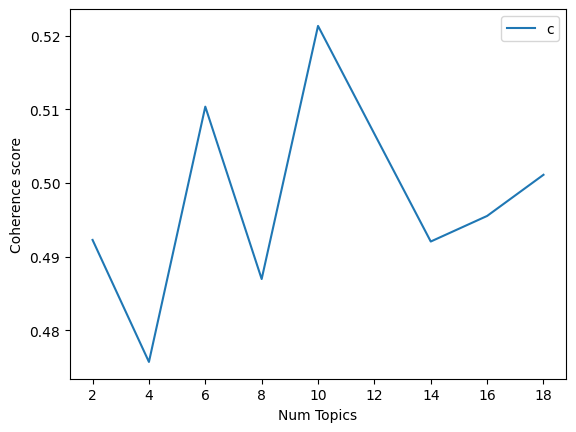

In [75]:

model_list3, coherence_values3 = compute_coherence_values(dictionary=id2word3, corpus=corpus3, texts=texts3, start=2, limit=20, step=2)

#Show graph
limit=20; start=2; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values3)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [101]:

lda_model3= gensim.models.ldamodel.LdaModel(corpus=corpus3,id2word=id2word3,
                                           num_topics=6,random_state=100,
                                           alpha='auto',per_word_topics=True)


In [102]:
from pprint import pprint
doc_lda3=lda_model3[corpus3]
pprint(lda_model3.print_topics())


[(0,
  '0.420*"application" + 0.077*"hate" + 0.008*"podcast" + 0.007*"playlist" + '
  '0.006*"crash" + 0.006*"phone" + 0.005*"stop" + 0.005*"company" + '
  '0.004*"smart_shuffle" + 0.003*"setting"'),
 (1,
  '0.109*"app" + 0.067*"hate" + 0.063*"bad" + 0.049*"song" + 0.037*"music" + '
  '0.033*"good" + 0.026*"spotify" + 0.020*"use" + 0.018*"play" + '
  '0.017*"listen"'),
 (2,
  '0.096*"great" + 0.047*"work" + 0.044*"amazing" + 0.030*"sweden" + '
  '0.025*"app" + 0.025*"poor" + 0.020*"ban" + 0.020*"service" + '
  '0.018*"excellent" + 0.013*"open"'),
 (3,
  '0.069*"country" + 0.026*"easy" + 0.019*"artist" + 0.017*"number" + '
  '0.014*"religion" + 0.013*"disrespect" + 0.012*"burn" + 0.012*"respect" + '
  '0.010*"support" + 0.010*"find"'),
 (4,
  '0.150*"ad" + 0.100*"love" + 0.055*"much" + 0.047*"many" + 0.043*"nice" + '
  '0.020*"music" + 0.016*"get" + 0.015*"awesome" + 0.013*"minute" + '
  '0.013*"great"'),
 (5,
  '0.035*"try" + 0.028*"waste" + 0.027*"account" + 0.025*"show" + 0.024*"log"

In [103]:

#compute perplexity
lda_perplexity3=lda_model3.log_perplexity(corpus3)
print('\nPerplexity:',lda_perplexity3)# a measure of how good the model is, lower the better.


#compute coherence score
coherence_model_lda3=CoherenceModel(model=lda_model3,texts=texts3,dictionary=id2word3,coherence='c_v')
coherence_lda3=coherence_model_lda3.get_coherence()
print('\nCoherence Score:',coherence_lda3)


Perplexity: -6.7617067218742

Coherence Score: 0.4691345895567414


In [104]:

# vis3=pyLDAvis.gensim_models.prepare(lda_model3,corpus3,id2word3)
# pyLDAvis.save_html(vis3,"spotify_after_before_oct.html")
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model3,corpus3,id2word3)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1      0.196031  0.122338       1        1  66.670727
4     -0.100192  0.287417       2        1   8.467547
5      0.018936 -0.044810       3        1   8.300879
0      0.250036 -0.151154       4        1   7.133425
2     -0.151808 -0.034005       5        1   5.015814
3     -0.213003 -0.179786       6        1   4.411608, topic_info=            Term          Freq         Total Category  logprob  loglift
248  application  21414.000000  21414.000000  Default  30.0000  30.0000
371         hate  35597.000000  35597.000000  Default  29.0000  29.0000
16            ad   9180.000000   9180.000000  Default  28.0000  28.0000
259         love   6844.000000   6844.000000  Default  27.0000  27.0000
22           app  52862.000000  52862.000000  Default  26.0000  26.0000
..           ...           ...           ...      ...      ...      ...
295      library    152.717661    175.664190   Topic6  -5.3277   2.9809
460         find    300.377349   1684.020767   Topic6  -4.6513   1.3970
83        create    176.390064    438.725755   Topic6  -5.1836   2.2098
26         music    260.971167  19647.832944   Topic6  -4.7919  -1.2004
61       spotify    249.019525  14302.361841   Topic6  -4.8388  -0.9297

[363 rows x 6 columns], token_table=      Topic      Freq   Term
term                        
619       1  0.998737    aap
0         1  0.631191   able
0         2  0.000718   able
0         3  0.353295   able
0         4  0.000718   able
...     ...       ...    ...
244       2  0.002076  wrong
244       3  0.819892  wrong
244       4  0.002076  wrong
244       6  0.022832  wrong
3164      1  0.995436  wrost

[704 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 5, 6, 1, 3, 4])

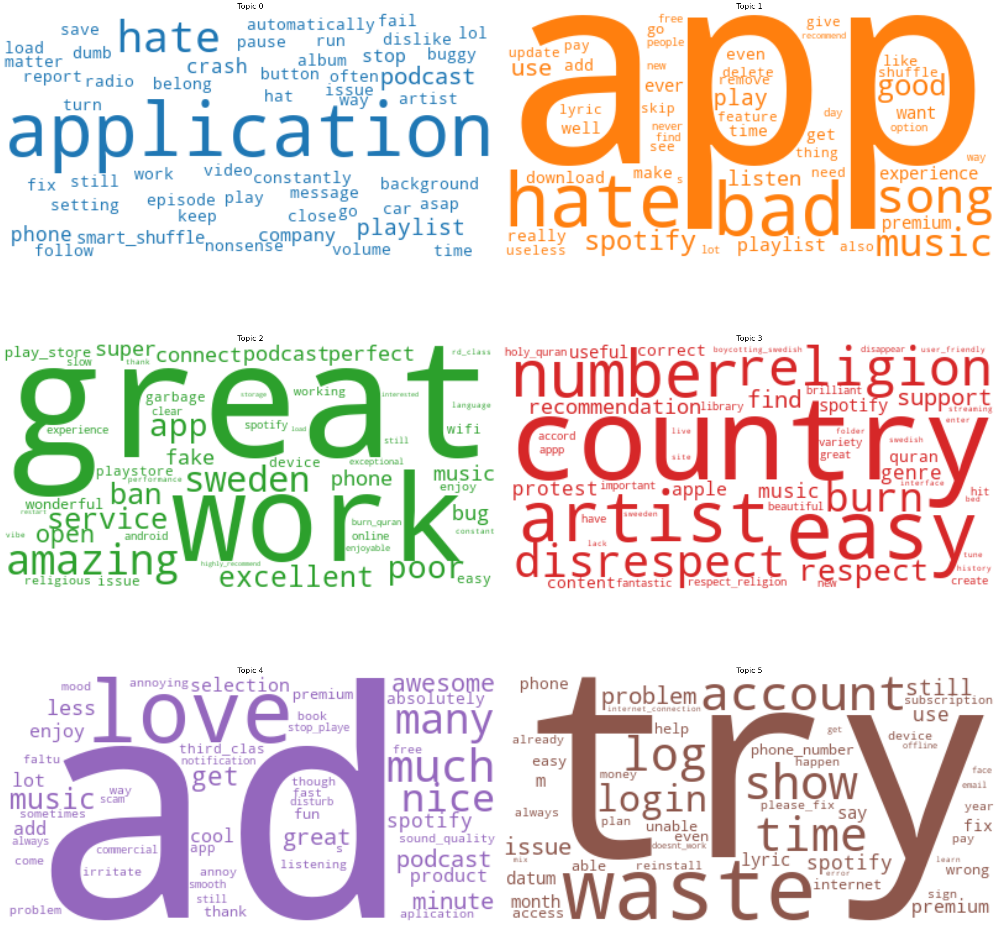

In [105]:
topics3 = lda_model3.show_topics(num_words=50,formatted=False)

fig, axes = plt.subplots(3, 2, figsize=(30,30), sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words3 = dict(topics3[i][1])
    cloud.generate_from_frequencies(topic_words3, max_font_size=300)
    plt.gca().imshow(cloud,interpolation='bilinear')
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=5, hspace=5)
plt.axis('off')
plt.margins(x=5, y=5)
plt.tight_layout()
plt.show()

In [106]:
df_topic_sents_keywords3 = format_topics_sentences(ldamodel=lda_model3, corpus=corpus3, texts=texts3)

In [ ]:

# Format
df_dominant_topic3 = df_topic_sents_keywords3.reset_index()
df_dominant_topic3.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic3.head(10)
df_after_before_oct[['OctB4_Dominant_Topic', 'OctB4_Topic_Perc_Contrib', 'OctB4_Keywords']]=df_dominant_topic3[['Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords']].values


In [83]:
# file_name = 'spotify_after_before_oct_result.xlsx'
# save_file = os.path.join(file_path, file_name)
# df_after_before_oct.to_excel(save_file,
#                  engine='openpyxl',
#                  startrow=0,
#                  startcol=0,
#                  header=True,
#                  na_rep='NaN',
#                  float_format='%.2f',
#                  sheet_name='Sheet1'
#                  )

after oct

In [84]:
data_lemmatized4=df_after_after_oct['words']
id2word4= corpora.Dictionary(data_lemmatized4)

In [85]:
texts4=(data_lemmatized4)

In [86]:
#Term Document Frequency
corpus4=[id2word4.doc2bow(text) for text in texts4]

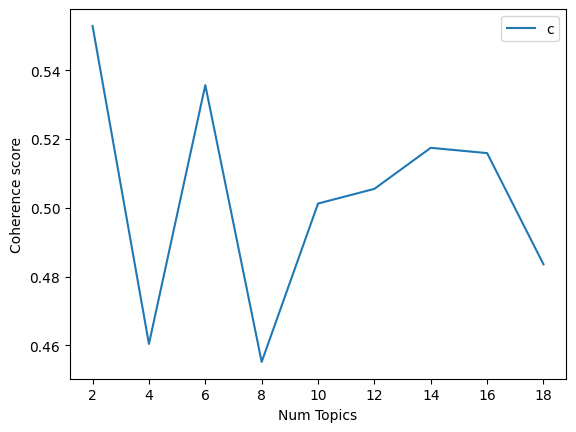

In [87]:

model_list4, coherence_values4 = compute_coherence_values(dictionary=id2word4, corpus=corpus4, texts=texts4, start=2, limit=20, step=2)

#Show graph
limit=20; start=2; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values4)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [88]:

lda_model4= gensim.models.ldamodel.LdaModel(corpus=corpus4,id2word=id2word4,
                                           num_topics=6,random_state=100,
                                           alpha='auto',per_word_topics=True)


In [89]:
from pprint import pprint
doc_lda4=lda_model4[corpus4]
pprint(lda_model4.print_topics())


[(0,
  '0.233*"ad" + 0.052*"many" + 0.039*"much" + 0.024*"get" + '
  '0.014*"advertisement" + 0.014*"full" + 0.014*"minute" + 0.013*"service" + '
  '0.011*"free" + 0.011*"pay"'),
 (1,
  '0.131*"good" + 0.125*"music" + 0.076*"app" + 0.049*"love" + 0.044*"great" + '
  '0.023*"nice" + 0.017*"spotify" + 0.016*"use" + 0.015*"podcast" + '
  '0.013*"listen"'),
 (2,
  '0.102*"day" + 0.049*"give" + 0.039*"much" + 0.034*"star" + 0.018*"option" + '
  '0.017*"poor" + 0.017*"getting_worse" + 0.017*"pathetic" + 0.016*"primium" + '
  '0.015*"perfect"'),
 (3,
  '0.057*"spotify" + 0.028*"lyric" + 0.020*"use" + 0.015*"app" + 0.014*"time" '
  '+ 0.012*"go" + 0.011*"get" + 0.011*"problem" + 0.010*"try" + 0.010*"show"'),
 (4,
  '0.156*"song" + 0.069*"play" + 0.034*"playlist" + 0.031*"listen" + '
  '0.023*"add" + 0.022*"shuffle" + 0.021*"want" + 0.019*"even" + 0.015*"lyric" '
  '+ 0.015*"like"'),
 (5,
  '0.109*"app" + 0.063*"premium" + 0.058*"bad" + 0.037*"update" + '
  '0.033*"music" + 0.031*"song" + 0.030

In [90]:

#compute perplexity
lda_perplexity4=lda_model4.log_perplexity(corpus4)
print('\nPerplexity:',lda_perplexity4)# a measure of how good the model is, lower the better.


#compute coherence score
coherence_model_lda4=CoherenceModel(model=lda_model4,texts=texts4,dictionary=id2word4,coherence='c_v')
coherence_lda4=coherence_model_lda4.get_coherence()
print('\nCoherence Score:',coherence_lda4)


Perplexity: -6.5065758567016845

Coherence Score: 0.5514771718198809


In [91]:

# vis4=pyLDAvis.gensim_models.prepare(lda_model4,corpus4,id2word4)
# pyLDAvis.save_html(vis4,"spotify_after.html")

pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model4,corpus4,id2word4)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5     -0.180149  0.001093       1        1  39.340982
3     -0.119702 -0.103130       2        1  22.320497
4     -0.129791 -0.196873       3        1  20.131952
1     -0.126910  0.306652       4        1  10.119800
0      0.259974 -0.095974       5        1   4.709983
2      0.296579  0.088231       6        1   3.376786, topic_info=         Term          Freq         Total Category  logprob  loglift
11       song  47447.000000  47447.000000  Default  30.0000  30.0000
38      music  29215.000000  29215.000000  Default  29.0000  29.0000
2          ad  11903.000000  11903.000000  Default  28.0000  28.0000
33       good  18674.000000  18674.000000  Default  27.0000  27.0000
32        app  58806.000000  58806.000000  Default  26.0000  26.0000
...       ...           ...           ...      ...      ...      ...
1071  upgrade    229.151300    380.769646   Topic6  -5.0718   2.8804
102    option    659.501443   4087.513260   Topic6  -4.0147   1.5640
0         add    429.543820   5526.970136   Topic6  -4.4435   0.8336
62       well    338.521293   7078.992423   Topic6  -4.6816   0.3479
84        get    323.854666   9253.849668   Topic6  -4.7259   0.0357

[407 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
858       1  0.998725      aap
231       3  0.998291  ability
18        1  0.063939     able
18        2  0.293794     able
18        3  0.641814     able
...     ...       ...      ...
460       1  0.391618  youtube
460       2  0.131245  youtube
460       3  0.083263  youtube
460       4  0.337991  youtube
460       6  0.055744  youtube

[842 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 4, 5, 2, 1, 3])

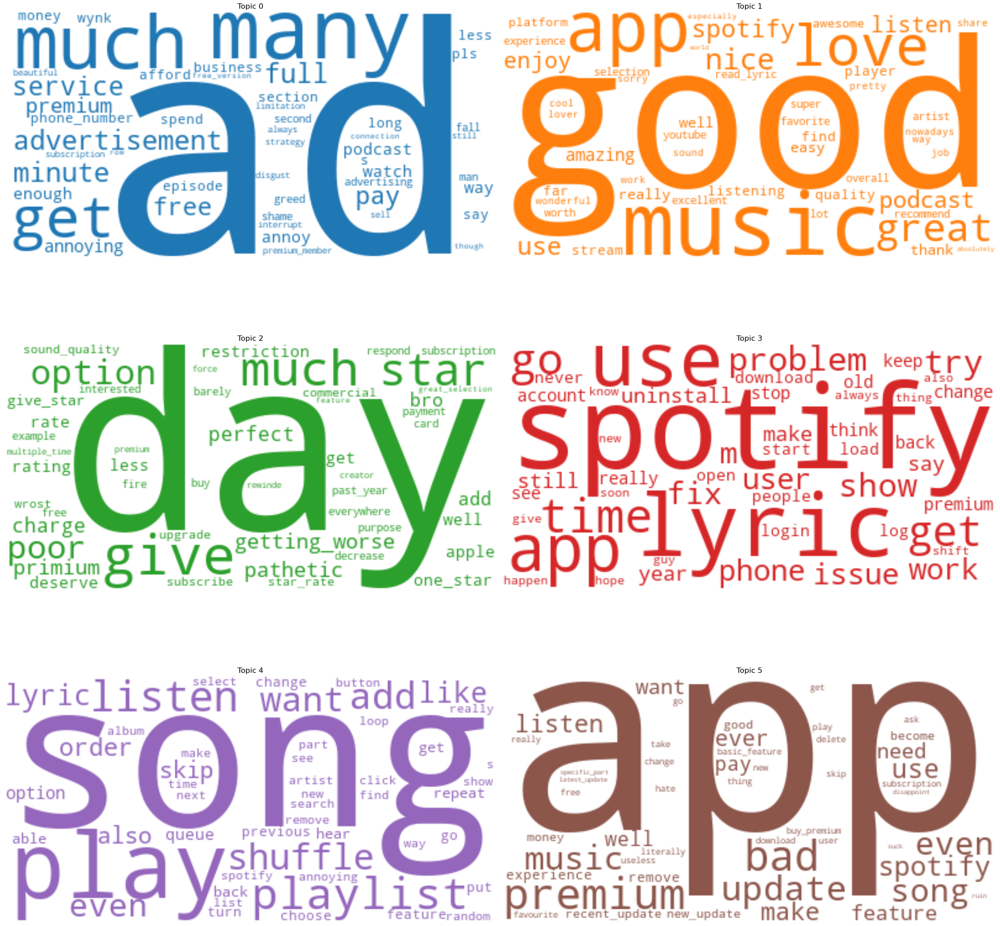

In [92]:
topics4 = lda_model4.show_topics(num_words=50,formatted=False)

fig, axes = plt.subplots(3, 2, figsize=(30,30), sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words4 = dict(topics4[i][1])
    cloud.generate_from_frequencies(topic_words4, max_font_size=300)
    plt.gca().imshow(cloud,interpolation='bilinear')
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=5, hspace=5)
plt.axis('off')
plt.margins(x=5, y=5)
plt.tight_layout()
plt.show()

In [93]:
df_topic_sents_keywords4 = format_topics_sentences(ldamodel=lda_model4, corpus=corpus4, texts=texts4)

In [94]:

# Format
df_dominant_topic4 = df_topic_sents_keywords4.reset_index()
df_dominant_topic4.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic4.head(10)
df_after_after_oct[['Oct_Dominant_Topic', 'Oct_Topic_Perc_Contrib', 'Oct_Keywords']]=df_dominant_topic4[['Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords']].values


In [95]:
# file_name = 'spotify_after_after_oct_result.xlsx'
# save_file = os.path.join(file_path, file_name)
# df_after_after_oct.to_excel(save_file,
#                  engine='openpyxl',
#                  startrow=0,
#                  startcol=0,
#                  header=True,
#                  na_rep='NaN',
#                  float_format='%.2f',
#                  sheet_name='Sheet1'
#                  )